<a href="https://colab.research.google.com/github/HarshithReddy01/Algorithms-Practice/blob/master/sorting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
print("Installing dependencies...")
!pip install -q torch torchvision Pillow numpy hdbscan scikit-learn open_clip_torch tqdm

Installing dependencies...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 76.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 5.1 MB/s eta 0:00:00


In [2]:
import os
import shutil
from pathlib import Path
from typing import List, Tuple
import numpy as np
import torch
from PIL import Image
from tqdm import tqdm
import open_clip
import hdbscan
from google.colab import files
import zipfile
import tarfile

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

PyTorch version: 2.9.0+cu126
CUDA available: True
GPU: NVIDIA A100-SXM4-40GB


/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning: invalid escape sequence '\{'
  $max \{ core_k(a), core_k(b), 1/\alpha d(a,b) \}$.


In [3]:
from google.colab import files
import zipfile, tarfile

print("\n" + "="*60)
print("UPLOAD YOUR IMAGES")
print("="*60)
print("Please upload a ZIP or TAR.GZ file containing your images...")

uploaded = files.upload()

for filename in uploaded.keys():
    print(f"\n Extracting {filename}...")

    if filename.endswith('.zip'):
        with zipfile.ZipFile(filename, 'r') as zip_ref:
            zip_ref.extractall('uploaded_images')
    elif filename.endswith(('.tar.gz', '.tgz', '.tar')):
        with tarfile.open(filename, 'r:*') as tar_ref:
            tar_ref.extractall('uploaded_images')

    print(f"Extracted to: uploaded_images/")



UPLOAD YOUR IMAGES
Please upload a ZIP or TAR.GZ file containing your images...


In [ ]:
from sklearn.cluster import KMeans

In [ ]:
INPUT_DIR = 'uploaded_images'
OUTPUT_DIR = 'clustered_images'


NUM_CLUSTERS = 15
BATCH_SIZE = 32
RANDOM_SEED = 42

print(f" Using K-Means with {NUM_CLUSTERS} forced clusters")
print("   This will create more fine-grained tool separation than HDBSCAN")

torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print("\n" + "="*60)
print(" COLONOSCOPY TOOL SORTING CONFIGURATION")
print("="*60)
print(f"Input directory: {INPUT_DIR}")
print(f"Output directory: {OUTPUT_DIR}")
print(f"Clustering method: K-Means")
print(f"Number of clusters: {NUM_CLUSTERS}")
print(f"Batch size: {BATCH_SIZE}")
print("="*60)
print(f" K-Means will force exactly {NUM_CLUSTERS} tool type clusters")
print("   Each cluster will contain visually similar surgical tools")
print("   Examples: forceps, snares, graspers, clips, needles, etc.")
print("="*60)

 Using K-Means with 15 forced clusters
   This will create more fine-grained tool separation than HDBSCAN

🔧 COLONOSCOPY TOOL SORTING CONFIGURATION
Input directory: uploaded_images
Output directory: clustered_images
Clustering method: K-Means
Number of clusters: 15
Batch size: 32
📝 K-Means will force exactly 15 tool type clusters
   Each cluster will contain visually similar surgical tools
   Examples: forceps, snares, graspers, clips, needles, etc.


In [ ]:
def find_image_files(input_dir: str) -> List[Path]:
    input_path = Path(input_dir)
    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}

    image_files = []
    for ext in image_extensions:
        image_files.extend(input_path.rglob(f'*{ext}'))
        image_files.extend(input_path.rglob(f'*{ext.upper()}'))

    return sorted(set(image_files))

print("\n Scanning for images...")
image_files = find_image_files(INPUT_DIR)
print(f" Found {len(image_files)} images\n")

if len(image_files) == 0:
    print(" ERROR: No images found! Check your INPUT_DIR path.")
    raise SystemExit

print("Sample files:")
for img in image_files[:5]:
    print(f"  {img.name}")



 Scanning for images...
 Found 590 images

Sample files:
  📷 ckcu8ty6z00003b5yzfaezbs5.jpg
  📷 ckcu8v7pr00013b5ymfi2z7uf.jpg
  📷 ckcu8w7vy00023b5y3vt2wczx.jpg
  📷 ckcu8xad600033b5yc78xfyjx.jpg
  📷 ckcu99qx200043b5yd2c5g84t.jpg


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"\nUsing device: {device}")

print("\n Loading CLIP model (ViT-B-32)...")
model, _, preprocess = open_clip.create_model_and_transforms(
    'ViT-B-32',
    pretrained='openai'
)
model = model.to(device)
model.eval()
print("CLIP model loaded successfully")


Using device: cuda

⏳ Loading CLIP model (ViT-B-32)...


/usr/local/lib/python3.12/dist-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


CLIP model loaded successfully


In [ ]:
def compute_embeddings(
    image_files: List[Path],
    model: torch.nn.Module,
    preprocess: callable,
    device: torch.device,
    batch_size: int = 32
) -> np.ndarray:
    embeddings = []

    with torch.no_grad():
        for i in tqdm(range(0, len(image_files), batch_size), desc=" Computing embeddings"):
            batch_files = image_files[i:i + batch_size]
            batch_images = []

            for img_path in batch_files:
                try:
                    img = Image.open(img_path).convert('RGB')
                    img_tensor = preprocess(img)
                    batch_images.append(img_tensor)
                except Exception as e:
                    print(f"\n Warning: Failed to process {img_path}: {e}")
                    batch_images.append(torch.zeros_like(preprocess(Image.new('RGB', (224, 224)))))

            if batch_images:
                batch_tensor = torch.stack(batch_images).to(device)
                features = model.encode_image(batch_tensor)
                features = features / features.norm(dim=-1, keepdim=True)
                embeddings.append(features.cpu().numpy())

    return np.vstack(embeddings)

print("\n" + "="*60)
embeddings = compute_embeddings(image_files, model, preprocess, device, BATCH_SIZE)
print(f" Embeddings computed! Shape: {embeddings.shape}")
print("="*60)

🧠 Computing embeddings: 100%|██████████| 19/19 [00:08<00:00,  2.14it/s]

 Embeddings computed! Shape: (590, 512)


In [ ]:
print(f"\n Clustering embeddings with K-Means (forcing {NUM_CLUSTERS} clusters)...")
print("K-Means will create more fine-grained tool separation")
print("Every image will be assigned to a cluster (no noise category)")

kmeans = KMeans(
    n_clusters=NUM_CLUSTERS,
    random_state=RANDOM_SEED,
    n_init=10,
    max_iter=300,
    verbose=0
)
labels = kmeans.fit_predict(embeddings)
print(" K-Means clustering complete")

unique_labels = sorted(set(labels))
num_clusters = len(unique_labels)

print(f"\nClustering complete!")
print(f"  Tool clusters created: {num_clusters}")
print(f"   All images assigned (no noise with K-Means)")
print(f"\n{'='*60}")
print("🔧 TOOL DISTRIBUTION BY CLUSTER")
print("="*60)
print("Each cluster represents visually similar tools")
print("-"*60)
for label in unique_labels:
    count = sum(labels == label)
    percentage = (count / len(labels)) * 100
    print(f"   cluster_{label}: {count} images ({percentage:.1f}%)")
print("="*60)


 Clustering embeddings with K-Means (forcing 15 clusters)...
K-Means will create more fine-grained tool separation
Every image will be assigned to a cluster (no noise category)
 K-Means clustering complete

Clustering complete!
  Tool clusters created: 15
   All images assigned (no noise with K-Means)

🔧 TOOL DISTRIBUTION BY CLUSTER
Each cluster represents visually similar tools
------------------------------------------------------------
   cluster_0: 41 images (6.9%)
   cluster_1: 52 images (8.8%)
   cluster_2: 36 images (6.1%)
   cluster_3: 82 images (13.9%)
   cluster_4: 34 images (5.8%)
   cluster_5: 9 images (1.5%)
   cluster_6: 91 images (15.4%)
   cluster_7: 15 images (2.5%)
   cluster_8: 15 images (2.5%)
   cluster_9: 32 images (5.4%)
   cluster_10: 36 images (6.1%)
   cluster_11: 6 images (1.0%)
   cluster_12: 21 images (3.6%)
   cluster_13: 74 images (12.5%)
   cluster_14: 46 images (7.8%)


In [ ]:
def organize_images(
    image_files: List[Path],
    labels: np.ndarray,
    output_dir: str
):
    output_path = Path(output_dir)
    output_path.mkdir(parents=True, exist_ok=True)

    unique_labels = set(labels)
    for label in unique_labels:
        cluster_dir = output_path / f"cluster_{label}"
        cluster_dir.mkdir(exist_ok=True)

    for img_path, label in tqdm(zip(image_files, labels), total=len(image_files), desc="📂 Organizing images"):
        cluster_dir = output_path / f"cluster_{label}"

        dest_path = cluster_dir / img_path.name

        if dest_path.exists():
            stem = img_path.stem
            suffix = img_path.suffix
            counter = 1
            while dest_path.exists():
                dest_path = cluster_dir / f"{stem}_{counter}{suffix}"
                counter += 1

        shutil.copy2(str(img_path), str(dest_path))

print(f"\nCopying images to output folders...")
organize_images(image_files, labels, OUTPUT_DIR)
print(f"Images organized into: {OUTPUT_DIR}")
print("\nOutput folder structure:")
print(f"   {OUTPUT_DIR}/")
for label in sorted(set(labels)):
    count = sum(labels == label)
    print(f"      ├── cluster_{label}/ ({count} images - tool type #{label})")
print()



Copying images to output folders...


📂 Organizing images: 100%|██████████| 590/590 [00:00<00:00, 3420.08it/s]

Images organized into: clustered_images

Output folder structure:
   clustered_images/
      ├── cluster_0/ (41 images - tool type #0)
      ├── cluster_1/ (52 images - tool type #1)
      ├── cluster_2/ (36 images - tool type #2)
      ├── cluster_3/ (82 images - tool type #3)
      ├── cluster_4/ (34 images - tool type #4)
      ├── cluster_5/ (9 images - tool type #5)
      ├── cluster_6/ (91 images - tool type #6)
      ├── cluster_7/ (15 images - tool type #7)
      ├── cluster_8/ (15 images - tool type #8)
      ├── cluster_9/ (32 images - tool type #9)
      ├── cluster_10/ (36 images - tool type #10)
      ├── cluster_11/ (6 images - tool type #11)
      ├── cluster_12/ (21 images - tool type #12)
      ├── cluster_13/ (74 images - tool type #13)
      ├── cluster_14/ (46 images - tool type #14)




VISUALIZING TOOL TYPES
Below you'll see sample images from each detected tool cluster
All images in a cluster should show the SAME TYPE of surgical tool



/tmp/ipython-input-4035968293.py:25: UserWarning: Glyph 128295 (\N{WRENCH}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128295 (\N{WRENCH}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


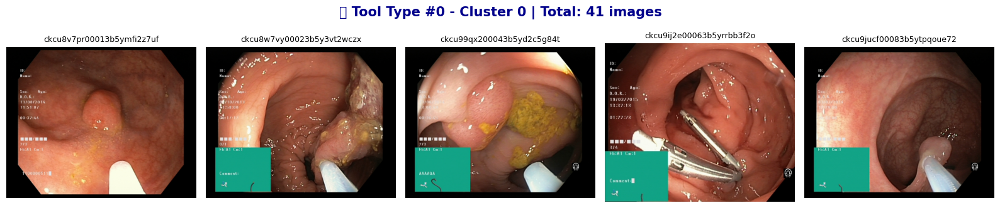

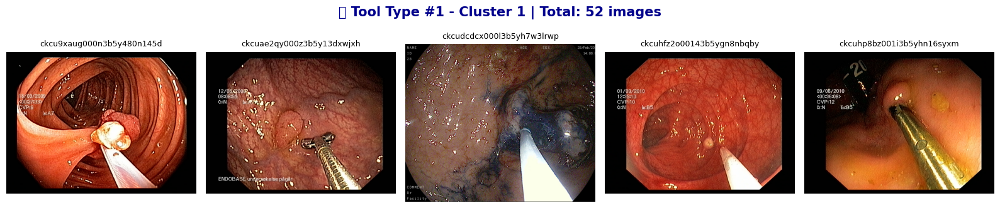

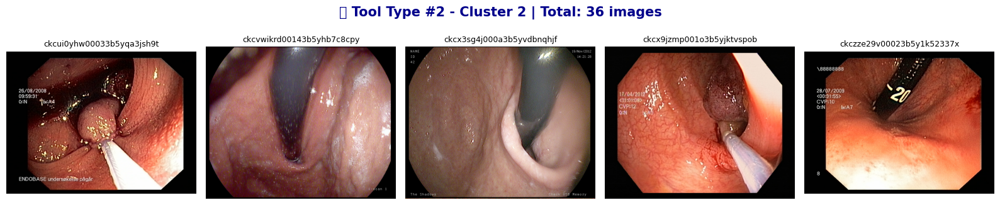

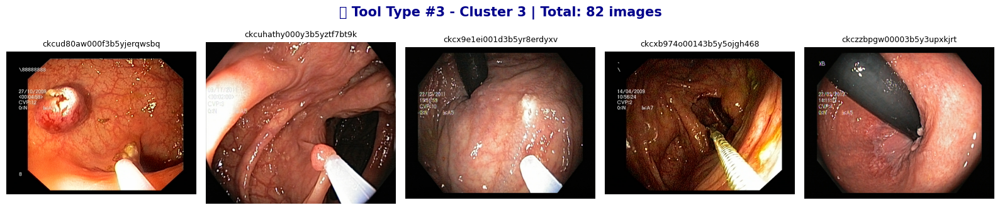

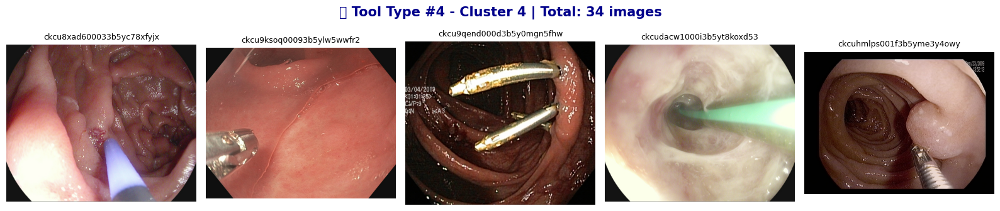

...

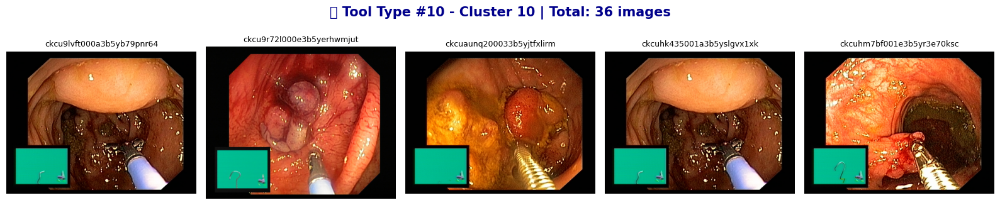

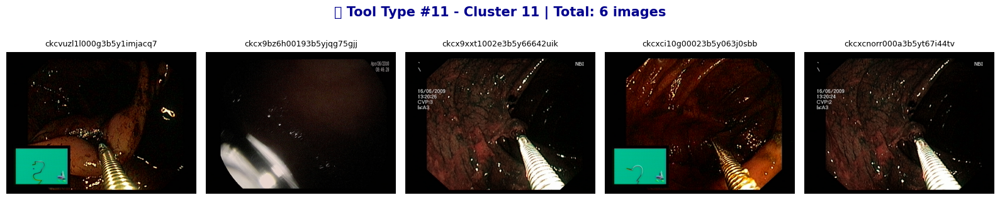

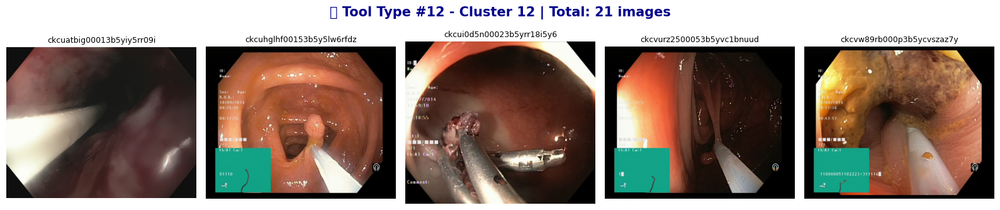

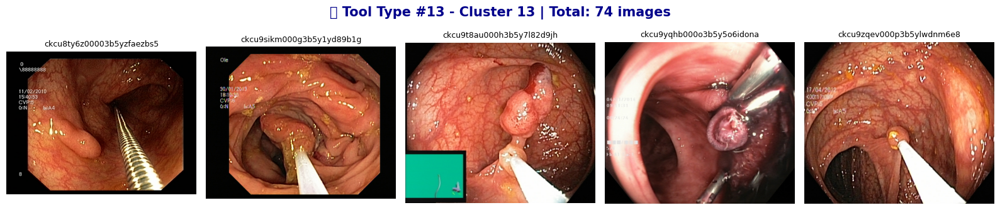

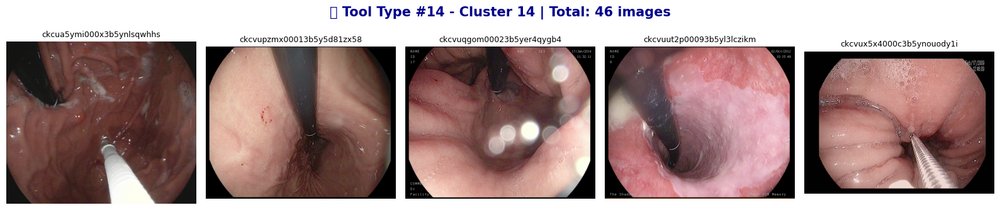

In [ ]:
import matplotlib.pyplot as plt

def visualize_clusters(image_files: List[Path], labels: np.ndarray, num_samples: int = 5):
    unique_labels = sorted(set(labels))

    for label in unique_labels[:15]:  # Show up to 15 tool types
        cluster_indices = np.where(labels == label)[0]
        sample_indices = cluster_indices[:min(num_samples, len(cluster_indices))]

        fig = plt.figure(figsize=(16, 3.5))
        fig.suptitle(f"🔧 Tool Type #{label} - Cluster {label} | Total: {len(cluster_indices)} images",
                     fontsize=15, fontweight='bold', color='darkblue')

        for i, idx in enumerate(sample_indices):
            img_path = image_files[idx]
            try:
                img = Image.open(img_path)
                plt.subplot(1, len(sample_indices), i + 1)
                plt.imshow(img)
                plt.axis('off')
                plt.title(img_path.name[:25], fontsize=9)
            except Exception as e:
                print(f"  Could not display {img_path.name}: {e}")

        plt.tight_layout()
        plt.show()

print("\n" + "="*60)
print("VISUALIZING TOOL TYPES")
print("="*60)
print("Below you'll see sample images from each detected tool cluster")
print("All images in a cluster should show the SAME TYPE of surgical tool")
print("="*60 + "\n")
visualize_clusters(image_files, labels, num_samples=5)

In [ ]:
print("\n" + "="*60)
print("CREATING DOWNLOAD ZIP")
print("="*60)
print("Creating ZIP file of sorted tools...")
!zip -r -q colonoscopy_tools_sorted.zip {OUTPUT_DIR}
print("ZIP file created: colonoscopy_tools_sorted.zip")

print("\n Starting download...")
files.download('colonoscopy_tools_sorted.zip')
print(" Download started! Check your browser's download folder.")
print("\n" + "="*60)
print("TOOL SORTING COMPLETE!")
print("="*60)
print("Your colonoscopy tools have been sorted into visually similar groups!")
print(f"Total clusters created: {NUM_CLUSTERS}")
print(f"All {len(image_files)} images organized into: {OUTPUT_DIR}/")
print("Each folder contains visually similar surgical instruments.")
print("\nTIP: If clusters are too mixed, increase NUM_CLUSTERS")
print("        If clusters are too fragmented, decrease NUM_CLUSTERS")
print("="*60)



CREATING DOWNLOAD ZIP
Creating ZIP file of sorted tools...
ZIP file created: colonoscopy_tools_sorted.zip

 Starting download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Download started! Check your browser's download folder.

TOOL SORTING COMPLETE!
Your colonoscopy tools have been sorted into visually similar groups!
Total clusters created: 15
All 590 images organized into: clustered_images/
Each folder contains visually similar surgical instruments.

TIP: If clusters are too mixed, increase NUM_CLUSTERS
        If clusters are too fragmented, decrease NUM_CLUSTERS


In [ ]:
!cd /content && zip -r Sorting-Dataset-colab.zip Sorting-Dataset
from google.colab import files
files.download('/content/Sorting-Dataset-colab.zip')


  adding: Sorting-Dataset/ (stored 0%)
  adding: Sorting-Dataset/README.md (stored 0%)
  adding: Sorting-Dataset/clustered_images/ (stored 0%)
  adding: Sorting-Dataset/clustered_images/cluster_11/ (stored 0%)
  adding: Sorting-Dataset/clustered_images/cluster_11/ckcxci10g00023b5y063j0sbb.jpg (deflated 1%)
  adding: Sorting-Dataset/clustered_images/cluster_11/ckcvuzl1l000g3b5y1imjacq7.jpg (deflated 1%)
  adding: Sorting-Dataset/clustered_images/cluster_11/ckcx9bz6h00193b5yjqg75gjj.jpg (deflated 1%)
  adding: Sorting-Dataset/clustered_images/cluster_11/ckcxcnorr000a3b5yt67i44tv.jpg (deflated 1%)
  adding: Sorting-Dataset/clustered_images/cluster_11/ckd04uref000k3b5ylany49e7.jpg (deflated 1%)
  adding: Sorting-Dataset/clustered_images/cluster_11/ckcx9xxt1002e3b5y66642uik.jpg (deflated 1%)
  adding: Sorting-Dataset/clustered_images/cluster_14/ (stored 0%)
  adding: Sorting-Dataset/clustered_images/cluster_14/ckcx42mgj000j3b5yymcy0tz1.jpg (deflated 1%)
  adding: Sorting-Dataset/clustered_i

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>